<p style="font-family: Arial; font-size:2.0em;"><b>MODELE EPIDEMIOLOGICZNE</b></p>

# 

In [1]:
using Plots
using DataFrames
using Statistics
using CSV

# 
# Model SIS

### Założenia modelu: 
- <font size="4">$\beta$ - tempo infekcji<font>
- <font size="4">$\gamma$ - tempo zdrowienia <font>
- <font size="4">pomijamy przyrost naturalny oraz śmierć z przyczyn naturalnych <font>
- <font size="4">zainfekowani nie umierają <font>
- <font size="4">populacja $ N = S + I $ jest stała<font>

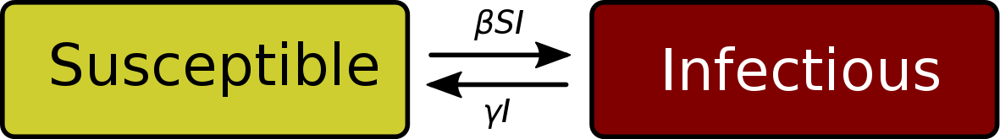

### Równania opisujące model SIS
# $ \frac{dS}{dt} = - \frac{\beta SI}{N} + \gamma I $
# $ \frac{dI}{dt} = \frac{\beta SI}{N} - \gamma I $

### Zastosowanie:
- <font size="4">grypa<font>
- <font size="4">choroby wywoływane bakterią (np. dżuma, rzeżączka)<font>
- <font size="4">choroby wywoływane przez pierwotniaki (np. malaria, śpiączka afrykańska)<font>

### Implementacja modelu

In [3]:
function SIS_model(
        population, 
        infected, 
        β,  # transmission coefficient
        γ,  # recovery rate
        T   # time
    )
    
    S = zeros(T, 1)   # Susceptible
    I = zeros(T, 1)   # Infectious
    
    S[1] = population - infected
    I[1] = infected
    N = population
    
    for t in 1:T-1
        S[t+1] = S[t] - (β * I[t] * S[t] / N) + (γ * I[t])
        I[t+1] = I[t] + (β * I[t] * S[t] / N) - (γ * I[t])
    end
    
    plot(1:T, S, label="S", xlabel="Time", ylabel="Population", title="β = $β")
    plt = plot!(1:T, I, label="I", color=:red)
    
    return plt
end

SIS_model (generic function with 1 method)

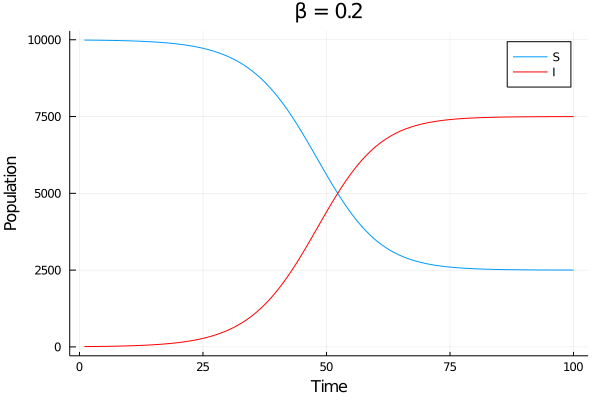

In [36]:
population = 10000
infected = 10
β = 0.2     # transmission coefficient
γ = 0.05    # recovery rate
T = 100     # time

SIS_model(population, infected, β, γ, T)

### Szukamy poziomu równowagi

Przyrównujemy przyrost podatnych do zera
# $ \frac{dS}{dt} = - \frac{\beta SI}{N} + \gamma I = 0 $
# $ \frac{\beta SI}{N} = \gamma I $
Po przekształceniu mamy
# $ S = \frac{\gamma}{\beta} N $
Ponieważ $ N = S + I $ to
# $ I = (1 - \frac{\gamma}{\beta})N $

### Ważne
- <font size="4">jeśli $ \frac{\beta}{\gamma} \leq 1 $ to epidemia wygasa<font>
- <font size="4">jeśli $ \frac{\beta}{\gamma} > 1 $ to epidemia przyjmuje stan równowagi<font>

┌ Info: Saved animation to 
│   fn = C:\Users\szymo\Jupyter Projects\SIS.gif
└ @ Plots C:\Users\szymo\.julia\packages\Plots\z5Msu\src\animation.jl:104


Plots.AnimatedGif("C:\\Users\\szymo\\Jupyter Projects\\SIS.gif")
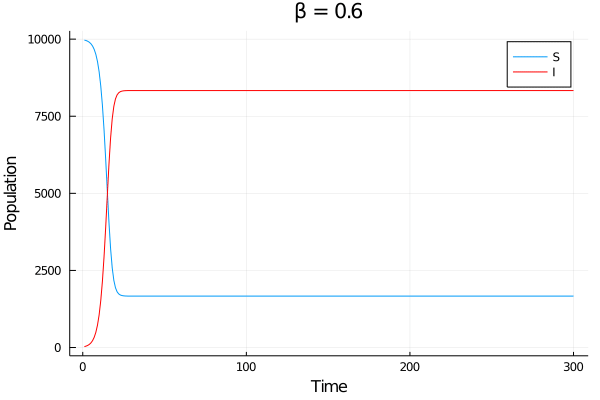

In [5]:
range = 0.6:-0.01:0.05

population = 10000
infected = 30
γ = 0.1    # recovery rate
T = 300     # time

anim = @animate for parameter in range
    SIS_model(population, infected, parameter, γ, T)
end

gif(anim, "SIS.gif", fps= 15)

# 
# Model SIR

<p style="font-family: Arial; font-size:1.4em;">Model ten opisuje osoby <i>podatne-zakażone-ozdrowiałe</i>.</p>

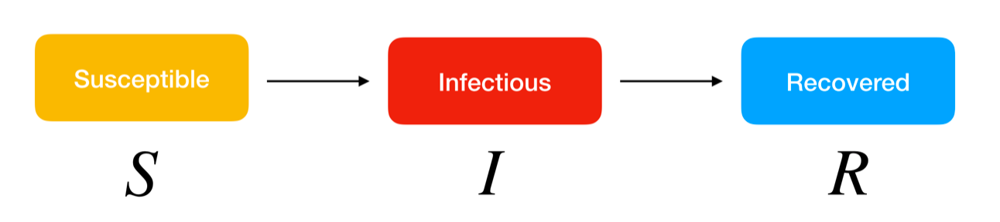

### Równania opisujące model SIR:

# $ \frac{dS}{dt} = - \frac{\beta SI}{N} $
# $ \frac{dI}{dt} = \frac{\beta SI}{N} - \gamma I $
# $ \frac{dR}{dt} = \gamma I $

<p style="font-family: Arial; font-size:1.75em;">Warunki początkowe:</p>

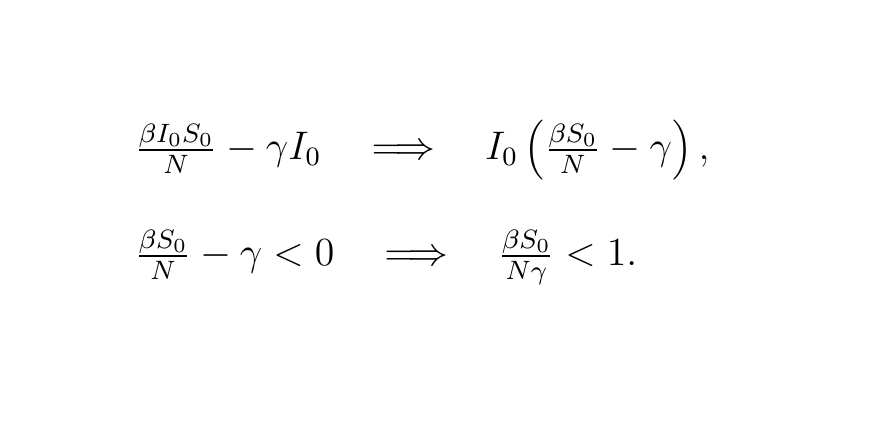

### Implementacja modelu

In [6]:
function SIR_model(
        population, 
        infected, 
        β,  # transmission coefficient
        γ,  # recovery rate
        T   # time
    )
    
    S = zeros(T, 1)   # Susceptible
    I = zeros(T, 1)   # Infectious
    R = zeros(T, 1)   # Recvered
    
    S[1] = population - infected
    I[1] = infected
    
    for t in 1:T-1
        N = population
        S[t+1] = S[t] - S[t] * I[t] * β / N 
        I[t+1] = I[t] - I[t] * γ + S[t] * I[t] * β / N
        R[t+1] = R[t] + I[t] * γ
    end
    
    plot(1:T, S, label="Susceptible", title = "The SIR model \nβ = $β",xlabel="Time", ylabel="Population")
    plot!(1:T, I, label="Infected")
    plot!(1:T, R, label="Removed")
end

SIR_model (generic function with 1 method)

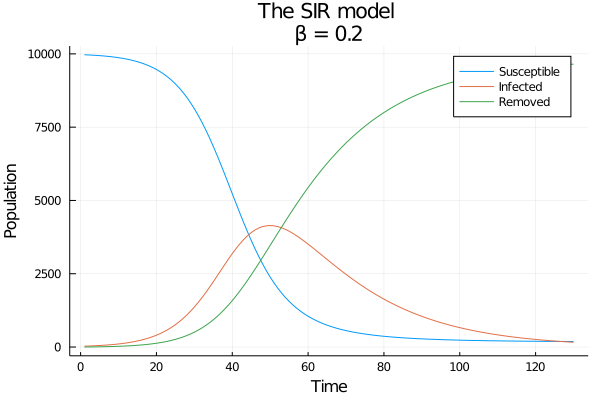

In [7]:
population = 10000
infected = 30
β = 0.2     # transmission coefficient
γ = 0.05    # recovery rate
T = 130     # time

SIR_model(population, infected, β, γ, T)

┌ Info: Saved animation to 
│   fn = C:\Users\szymo\Jupyter Projects\SIR.gif
└ @ Plots C:\Users\szymo\.julia\packages\Plots\z5Msu\src\animation.jl:104


Plots.AnimatedGif("C:\\Users\\szymo\\Jupyter Projects\\SIR.gif")
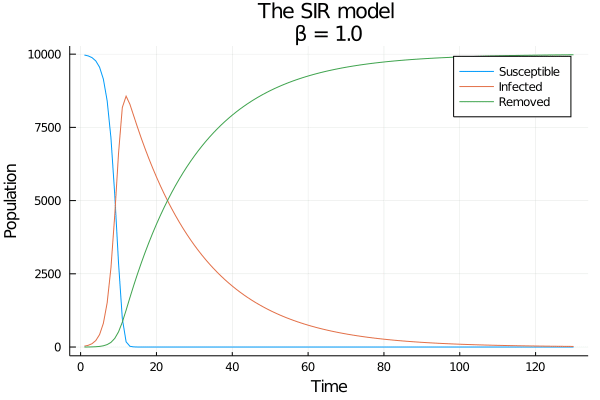

In [19]:
range = LinRange(1, 0.1, 101)

anim = @animate for param in range
    SIR_model(population, infected, round(param, digits=3), γ, T)
end

gif(anim, "SIR.gif", fps= 10)

# 
# Model SIRD

### Założenia modelu:
<font size="4">$\beta$ - współczynnik zainfekowania<font><br>
<font size="4">$\delta$ - śmiertelność w wyniku infekcji<font><br>
<font size="4">$\gamma$ - tempo zdrowienia<font><br>
<font size="4">populacja wraz ze zmarłymi $ N = S + I + R + D $ jest stała<font>

    
    
<font size="4">Model ten opisuje osoby <i>podatne-zakażone-ozdrowiałe-zmarłe</i><br>
<font size="4">Nowy element : <b>D</b> - osoby zmarłe. <br>

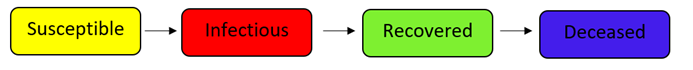

### Uwagi:

 - <font size="4">Bardzo popularny model epidemiologiczny <font><br>
 - <font size="4">Klasa D będzie szczególnie ważna w modelach rozprzestrzeniania się chorób o dużej śmiertelności. Do takich epidemii możemy zaliczyć np. Epidemię gorączki krwotocznej Ebola w Afryce Zachodniej (2014-2015), Pandemię grypy hiszpanki (1918-1920), Ospę prawdziwą (1877-1977). <font><br>
 - <font size="4">Pomijamy przyrost naturalny oraz śmierć z przyczyn naturalnych<font>

### Równania opisujące model SIRD:

# $ \frac{dS}{dt} = - \frac{\beta SI}{N} $
# $ \frac{dI}{dt} = \frac{\beta SI}{N} - \gamma I - \delta I $
# $ \frac{dR}{dt} = \gamma I $
# $ \frac{dD}{dt} = \delta I $

### Implementacja modelu

In [8]:
function SIRD_model(
        population, 
        infected, 
        β,  # transmission coefficient
        δ,  # infection mortality
        γ,  # recovery rate
        T   # time
    )
    
    S = zeros(T, 1)   # Susceptible
    I = zeros(T, 1)   # Infectious
    R = zeros(T, 1)   # Recovered
    D = zeros(T, 1)   # Deceased
    
    S[1] = population - infected
    I[1] = infected
    
    for t in 1:T-1
        N = population
        S[t+1] = S[t] - S[t] * I[t] * β / N
        I[t+1] = I[t] * (1 - δ - γ) + S[t] * I[t] * β / N
        R[t+1] = R[t] + γ * I[t]
        D[t+1] = D[t] + δ * I[t]
    end
    
    deaths = Int(floor(D[T]))
    
    plot(1:T, S, label="Susceptible", title = "Deaths from infection: $deaths\nβ = $β", xlabel="Time", ylabel="Population")
    plot!(1:T, I, label="Infected")
    plot!(1:T, R, label="Recovered")
    plt = plot!(1:T, D, label="Deceased")
    
    return plt
end

SIRD_model (generic function with 1 method)

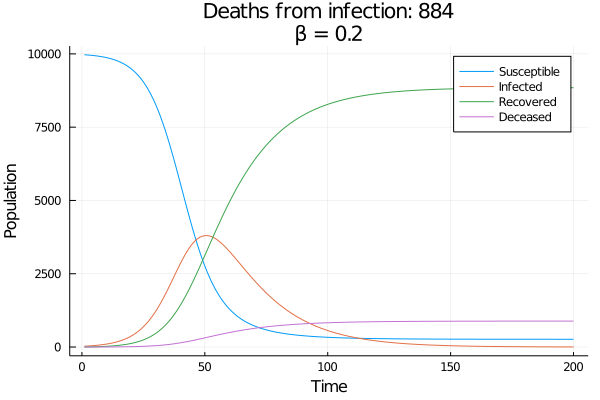

In [9]:
population = 10000
infected = 30
β = 0.2      # transmission coefficient
δ = 0.005    # infection mortality
γ = 0.05     # recovery rate
T = 200      # time

SIRD_model(population, infected, β, δ, γ, T)

┌ Info: Saved animation to 
│   fn = C:\Users\szymo\Jupyter Projects\SIRD.gif
└ @ Plots C:\Users\szymo\.julia\packages\Plots\z5Msu\src\animation.jl:104


Plots.AnimatedGif("C:\\Users\\szymo\\Jupyter Projects\\SIRD.gif")
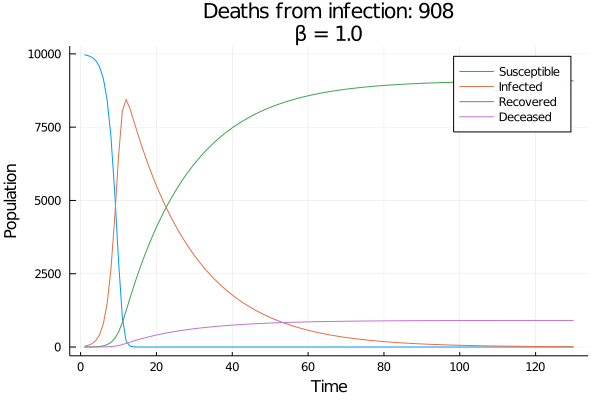

In [30]:
range = LinRange(1, 0.1, 101)

anim = @animate for param in range
    SIRD_model(10000, 30, round(param, digits=3), 0.005, 0.05, 130)
end

gif(anim, "SIRD.gif", fps= 15)

# 
# Model SEIR

### Założenia modelu:
   <font size="4">$\beta$ - współczynnik zainfekowania<font><br>
   <font size="4">a - tempo rozwoju infekcji<font><br>
   <font size="4">$\gamma$ - tempo zdrowienia<font>

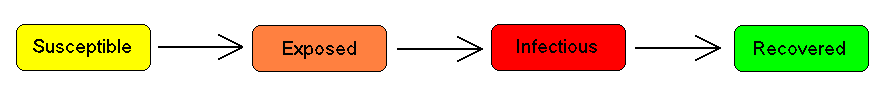

### Uwagi:

 - <font size="4">Bardzo popularny model epidemiologiczny <font><br>
 - <font size="4">Stosuje się różne warianty(założenia) SEIR <font><br>
 - <font size="4">Pomijamy przyrost naturalny oraz śmierć z przyczyn naturalnych<font>
 - <font size="4">$ N = S + E + I + R $  jest stałe<font>

### Równania opisujące model SEIR:

# $ \frac{dS}{dt} = - \frac{\beta SI}{N} $
# $ \frac{dE}{dt} = \frac{\beta SI}{N} -aE $
# $ \frac{dI}{dt} = a E - \gamma I $
# $ \frac{dR}{dt} = \gamma I $

### Implementacja modelu

In [10]:
function SEIR_model(
        population, 
        infected, 
        β,  # transmission coefficient
        a,  # incubation rate
        γ,  # recovery rate
        T   # time
    )
    
    S = zeros(T, 1)   # Susceptible
    E = zeros(T, 1)   # Exposed
    I = zeros(T, 1)   # Infectious
    R = zeros(T, 1)   # Recovered
    
    S[1] = population - infected
    I[1] = infected
    
    for t in 1:T-1
        N = population
        S[t+1] = S[t] - S[t] * I[t] * β / N
        E[t+1] = E[t] * (1 - a) + S[t] * I[t] * β / N
        I[t+1] = I[t] * (1 - γ) + E[t] * a
        R[t+1] = R[t] + I[t] * γ
    end
    
    plot(1:T, S, label="Susceptible", title = "β = $β", xlabel="Time", ylabel="Population")
    plot!(1:T, E, label="Exposed", color=:orange)
    plot!(1:T, I, label="Infected", color=:red)
    plt = plot!(1:T, R, label="Recovered", color=:green)
    
    return plt
end

SEIR_model (generic function with 1 method)

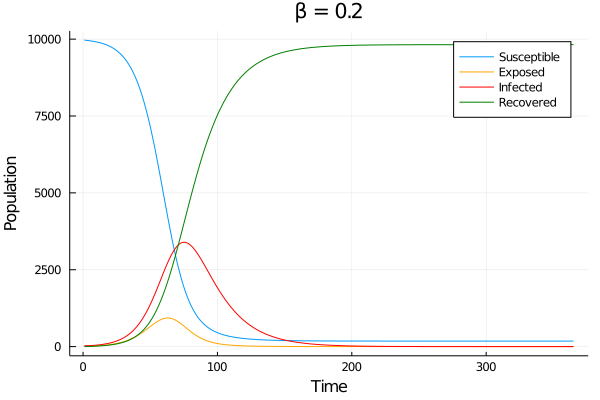

In [11]:
population = 10000
infected = 30
β = 0.2      # transmission coefficient
a = 0.25     # incubation rate
γ = 0.05     # recovery rate
T = 365      # time


SEIR_model(population, infected, β, a, γ, T)

┌ Info: Saved animation to 
│   fn = C:\Users\szymo\Jupyter Projects\SEIR.gif
└ @ Plots C:\Users\szymo\.julia\packages\Plots\z5Msu\src\animation.jl:104


Plots.AnimatedGif("C:\\Users\\szymo\\Jupyter Projects\\SEIR.gif")
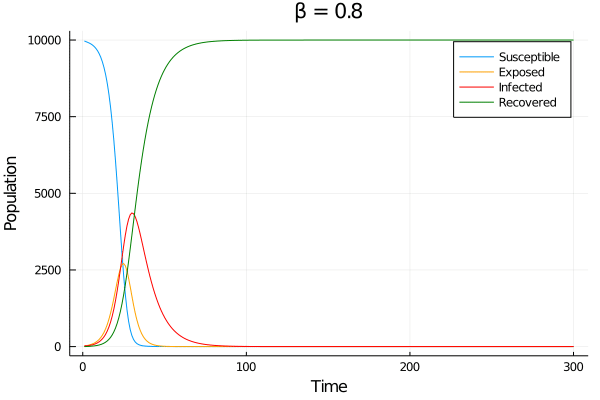

In [37]:
range = 0.8:-0.01:0.1

anim = @animate for parameter in range
    SEIR_model(population, infected, parameter, a, γ, T)
end

gif(anim, "SEIR.gif", fps= 10)

# 
# Model MSIR

- <font size="4">najczęściej wykorzystywany do długoterminowych epidemii<font>
- <font size="4">nowonarodzeni zyskują czasową odporność<font>
- <font size="4">w modelu można przyjąć, że przyrost naturalny jest równy śmierciom - wtedy N jest stałe<font>

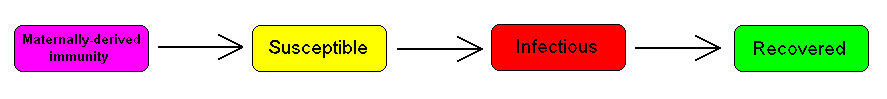

## Inne przykłady bardziej złożonych modeli:
<font size="5"> SEIRD, SEIRS, MSEIR, MSEIRS <font>

# 
# Model SEIRSD

### Założenia modelu:
- <font size="4">pomijamy przyrost naturalny oraz śmierć z przyczyn naturalnych <font>
- <font size="4">zainfekowani umierają z prawdopodobieństwem $\delta$<font>
- <font size="4">$ N(t) = S(t) + E(t) + I(t) + R(t) + D(t) $ jest stałe<font>

<font size="4">$\beta$ - współczynnik zainfekowania<font><br>
<font size="4">a - tempo rozwoju infekcji<font><br>
<font size="4">$\delta$ - śmiertelność w wyniku infekcji<font><br>
<font size="4">$\gamma$ - tempo zdrowienia<font><br>
<font size="4">p - tempo tracenia odporności<font>

# $ \frac{dS}{dt} = - \frac{\beta SI}{N} + pR $
# $ \frac{dE}{dt} = \frac{\beta SI}{N} - aE $
# $ \frac{dI}{dt} = aE - (\gamma + \delta)I $
# $ \frac{dR}{dt} = \gamma I - pR $
# $ \frac{dD}{dt} = \delta I $

### Implementacja modelu

In [3]:
function SEIRSD_model(
        population, 
        infected, 
        β,  # transmission coefficient
        a,  # incubation rate
        δ,  # infection mortality
        γ,  # recovery rate
        p,  # loosing immunity rate
        T,  # time
        mode  # return plot ("plot") or deaths ("deaths")
    )
    
    S = zeros(T, 1)   # Susceptible
    E = zeros(T, 1)   # Exposed
    I = zeros(T, 1)   # Infectious
    R = zeros(T, 1)   # Recovered
    D = zeros(T, 1)   # Deceased
    
    S[1] = population - infected
    I[1] = infected
    
    for t in 1:T-1
        N = population
        S[t+1] = S[t] - S[t] * I[t] * β / N + R[t] * p
        E[t+1] = E[t] * (1 - a) + S[t] * I[t] * β / N
        I[t+1] = I[t] * (1 - δ - γ) + E[t] * a
        R[t+1] = R[t] * (1 - p) + I[t] * γ
        D[t+1] = D[t] + δ * I[t]
    end
    
    deaths = Int(floor(D[T]))
    
    plot(1:T, S, label="S", title = "Deaths from infection: $deaths\nβ = $β", xlabel="Time", ylabel="Population")
    plot!(1:T, E, label="E", color=:orange)
    plot!(1:T, I, label="I", color=:red)
    plot!(1:T, R, label="R", color=:green)
    plt = plot!(1:T, D, label="D", color=:black)
    
    if mode == "plot"
        return plt
    elseif mode == "deaths"
        return deaths
    end
end

SEIRSD_model (generic function with 1 method)

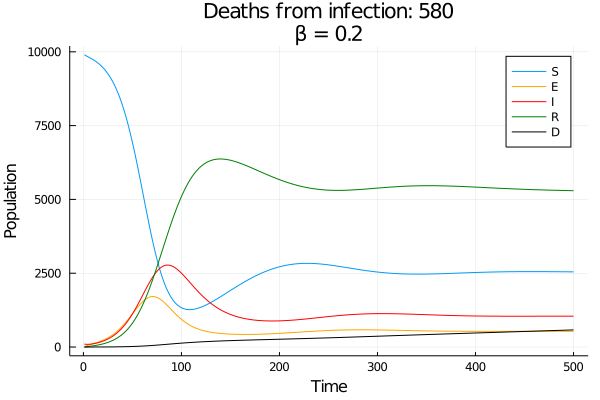

In [4]:
population = 10000
infected = 100
β = 0.2     # transmission coefficient
a = 0.1     # incubation rate
δ = 0.001   # infection mortality
γ = 0.05    # recovery rate
p = 0.01    # loosing immunity rate
T = 500     # time

SEIRSD_model(population, infected, β, a, δ, γ, p, T, "plot")

┌ Info: Saved animation to 
│   fn = C:\Users\szymo\Jupyter Projects\SEIRSD.gif
└ @ Plots C:\Users\szymo\.julia\packages\Plots\z5Msu\src\animation.jl:104


Plots.AnimatedGif("C:\\Users\\szymo\\Jupyter Projects\\SEIRSD.gif")
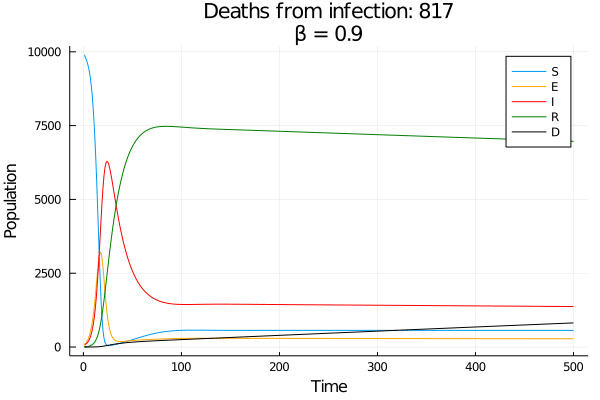

In [5]:
range = 0.9:-0.01:0.05

population = 10000
infected = 100
a = 0.25    # incubation rate
δ = 0.001   # infection mortality
γ = 0.05    # recovery rate
p = 0.01    # loosing immunity rate
T = 500     # time

anim = @animate for parameter in range
    SEIRSD_model(population, infected, parameter, a, δ, γ, p, T, "plot")
end

gif(anim, "SEIRSD.gif", fps= 15)

### Porównajmy liczbę zgonów dla różnych $\beta$

In [14]:
population = 10000
infected = 100
β = 0.2     # transmission coefficient
a = 0.25    # incubation rate
δ = 0.001   # infection mortality
γ = 0.05    # recovery rate
p = 0.01    # loosing immunity rate
T = 500     # time

println(" β  | deaths")
println("----|-------")
for β in 0.1:0.1:1
    deaths = SEIRSD_model(population, infected, β, a, δ, γ, p, T, "deaths")
    println(β, " |  ", deaths)
end

 β  | deaths
----|-------
0.1 |  388
0.2 |  624
0.3 |  705
0.4 |  746
0.5 |  771
0.6 |  788
0.7 |  800
0.8 |  810
0.9 |  817
1.0 |  822


# 
# 
# SYMULACJA EPIDEMII
## 

In [7]:
"Simulate the epidemic using given parameteres.
Display the plot of infected number and the animation of epidemic progress.
Return a vector containing total deaths and maximum infected with symptoms number."
function area_epidemic_simulation(
        size,   # side of an array representing population
        N0,   # first infected
        meetings,   # number of meetings per day for one person
        incubation_time,   # virus incubation time
        immunity_time,   # immunity time after recovery
        lockdowns,   # periods of time with lockdown
        vaccination_day,   # day when vaccination begins
        vaccinations,   # percent of population vaccinated per day
        vaccine_immunity_time,   # vaccine immunity time
        death_prob,   # death from infection
        recovery_prob,   # probability of recovery after infection
        infection_probability,   # probability of infection
        symptoms_prob,   # probability of having symptoms after infection
        move_probability,   # probability o moving for one person
        T,   # time
        display_heatmap=true,
        display_plot=true)
    
    # 0 - dead
    # 1 - susceptible
    # 2 - exposed
    # 3 - infected
    # 4 - recovered

    # Conteners for each state
    dead = []
    susceptible = collect(1:size^2)
    exposed = []
    infected = []
    infected_asymptomatic = []
    recovered = []
    vaccinated = []
    unvaccinated = collect(1:size^2)

    # Records
    total_infected_record = [N0]
    infected_record = [0]
    dead_record = [0]

    population = ones(size, size)   # Array with each person's state
    infection_days = fill(T, size, size)   # Array with days of infection
    recovery_days = fill(T, size, size)   # Array with days of recovery
    vaccination_days = fill(T, size, size)   # Array with days of vaccination

    vaccinations = floor(vaccinations * size^2)  # Number of vaccinations in one day

    # Random first infected
    for person in 1:N0
        index = rand(susceptible)
        population[index] = 3
        append!(infected_asymptomatic, index)
        filter!(i -> i != index, susceptible)
    end

    # For each day in T days
    anim = @animate for t in 1:T
        infection_prob = infection_probability
        met_today = meetings
        move_prob = move_probability
        
        # If it's lockdown, reduce infection probability, meetings and moving probability
        for lockdown in lockdowns
            if lockdown[1] <= t <= lockdown[2]
                if lockdown[3] == 1      # Light lockdown
                    infection_prob = 0.7 * infection_prob
                    met_today = 2
                    move_prob = 0.7 * move_prob
                elseif lockdown[3] == 2  # Heavy lockdown
                    infection_prob = 0.5 * infection_prob
                    met_today = 1
                    move_prob = 0.5 * move_prob
                end
            end
        end

        # Vaccination
        if t >= vaccination_day
            possible_to_vaccinate = filter(i -> i ∉ infected, unvaccinated)
            for person in 1:vaccinations
                try
                    index = rand(possible_to_vaccinate)
                    append!(vaccinated, index)
                    filter!(i -> i != index, unvaccinated)
                    filter!(i -> i != index, possible_to_vaccinate)
                    vaccination_days[index] = t
                catch ArgumentError
                    continue
                end
            end
        end

        # For each person
        for row in 1:size
            for person in 1:size

                index = size*(person-1) + row

                # If vaccine immunity time has ended
                if t - vaccination_days[index] >= vaccine_immunity_time
                    append!(unvaccinated, index)
                    filter!(i -> i != index, vaccinated)
                end
                
                # If person is exposed and incubation time has ended, change her status to infected
                if population[index] == 2 && t - infection_days[index] >= incubation_time
                    population[index] = 3
                    if index ∈ vaccinated   # If person is vaccinated, reduce symptoms probability
                        if rand()<symptoms_prob/5
                            append!(infected, index)
                        else
                            append!(infected_asymptomatic, index)
                        end
                    elseif rand()<symptoms_prob
                        append!(infected, index)
                    else
                        append!(infected_asymptomatic, index)
                    end
                    filter!(i -> i != index, exposed)
                end

                # If person is healthy and travels
                if index ∉ vcat(infected_asymptomatic, infected, dead) && rand()<move_prob
                    inf_prob = infection_prob
                    random_person = rand(1:size^2)   # Random met person
                    if random_person ∈ infected_asymptomatic   # If met person is infected asymptopmatic
                        
                        # If travelling person is vaccinated, reduce infection probability
                        if index ∈ vaccinated
                            inf_prob = inf_prob/6
                        end

                        # If travelling person is susceptible
                        if population[index] == 1 && rand()<inf_prob
                            population[index] = 2
                            append!(exposed, index)
                            filter!(i -> i != index, susceptible)
                            infection_days[index] = t
                        
                        # If travelling person is recovered
                        elseif population[index] == 4
                            time_from_recovery = t - recovery_days[index]
                            full_immunity_time = floor(0.3 * immunity_time)
                            inf_prob = inf_prob * (time_from_recovery - full_immunity_time) / (immunity_time - full_immunity_time)
                            if time_from_recovery >= full_immunity_time && rand()<inf_prob
                                population[index] = 2
                                append!(exposed, index)
                                filter!(i -> i != index, recovered)
                                infection_days[index] = t
                            end
                        end
                    end
                end
                
                # If the person is infected
                if population[row, person] == 3
                    
                    # If person is infected asymptomatic, he can travel or stay home
                    if index ∈ infected_asymptomatic
                        
                        # If infected person travels
                        if rand()<move_prob
                            inf_prob = infection_prob
                            random_person = rand(1:size^2)   # Random met person

                            # If met person is vaccinated reduce infection probability
                            if random_person ∈ vaccinated
                                inf_prob = inf_prob/6
                            end

                            # If met person is susceptible
                            if population[random_person] == 1 && rand()<inf_prob
                                population[random_person] = 2
                                append!(exposed, random_person)
                                filter!(i -> i != random_person, susceptible)
                                infection_days[random_person] = t

                            # If met person is recovered
                            elseif population[random_person] == 4
                                time_from_recovery = t - recovery_days[random_person]
                                full_immunity_time = floor(0.3 * immunity_time)
                                inf_prob = inf_prob * (time_from_recovery - full_immunity_time) / (immunity_time - full_immunity_time)
                                if time_from_recovery >= full_immunity_time && rand()<inf_prob
                                    population[random_person] = 2
                                    append!(exposed, random_person)
                                    filter!(i -> i != random_person, recovered)
                                    infection_days[random_person] = t
                                end
                            end
                        
                        # If person stays home
                        else
                            # For each met person from the neighbourhood
                            for met_person in 1:met_today
                                inf_prob = infection_prob
                                m = rand(-1:1)
                                n = rand(-1:1)

                                # If we go out of range
                                if row + m > size || row + m < 1 || person + n > size || person + n < 1
                                    continue
                                end

                                neighbour = size * (person + n - 1) + row + m

                                # If met neighbour is vaccinated, reduce infection probability
                                if neighbour ∈ vaccinated
                                    inf_prob = inf_prob/6
                                end

                                # If neighbour is susceptible
                                if population[row + m, person + n] == 1 && rand()<inf_prob
                                    population[neighbour] = 2
                                    append!(exposed, neighbour)
                                    filter!(i -> i != neighbour, susceptible)
                                    infection_days[neighbour] = t

                                # If neighbour is recovered
                                elseif population[neighbour] == 4
                                    time_from_recovery = t - recovery_days[neighbour]
                                    full_immunity_time = floor(0.3 * immunity_time)
                                    inf_prob = inf_prob * (time_from_recovery - full_immunity_time) / (immunity_time - full_immunity_time)
                                    if time_from_recovery >= full_immunity_time && rand()<inf_prob
                                        population[neighbour] = 2
                                        append!(exposed, neighbour)
                                        filter!(i -> i != neighbour, recovered)
                                        infection_days[neighbour] = t
                                    end
                                end
                            end
                        end
                    end
                    
                    # Infected person can recover
                    if rand()<recovery_prob
                        population[index] = 4
                        append!(recovered, index)
                        filter!(i -> i != index, infected)
                        filter!(i -> i != index, infected_asymptomatic)
                        recovery_days[index] = t
                    
                    # If infected person has symptoms he can die
                    elseif index ∈ infected && rand()<death_prob
                        population[index] = 0
                        append!(dead, index)
                        filter!(i -> i != index, infected)
                    end
                
                # If person looses immunity
                elseif population[index] == 4 && t - recovery_days[index] >= immunity_time
                    population[index] = 1
                    append!(susceptible, index)
                    filter!(i -> i != index, recovered)
                end
            end
        end

        total_infected_number = length(infected) + length(infected_asymptomatic)
        deaths = length(dead)
        append!(total_infected_record, total_infected_number)
        append!(infected_record, length(infected))
        append!(dead_record, deaths)
        
        if display_heatmap
            heatmap(population,
                title="Day: $t    Deaths: $deaths",
                color=[:black, :lemonchiffon, :orange, :orange, :green4],
                clim=(0, 4),
                size=(650, 650),
                aspectratio=1
            )
        end
    end
    deaths = length(dead)
    max_symptoms_infected = maximum(infected_record)

    if display_plot
        plot(0:T, total_infected_record, title="Deaths: $deaths", legend=false)
        plot!(0:T, dead_record)
        plot!(0:T, infected_record) |> display
    end

    if display_heatmap
        gif(anim, "epidemic.gif", fps=15) |> display
    end

    return [deaths, max_symptoms_infected]
end

area_epidemic_simulation

### Stałe parametry

In [6]:
size = 100  # Population - 10 000
N0 = 10
incubation_time = 5
immunity_time = 240
vaccine_immunity_time = 180
death_prob = 0.002
recovery_prob = 0.04
symptoms_prob = 0.5

0.5

## 
## Wizualizacja

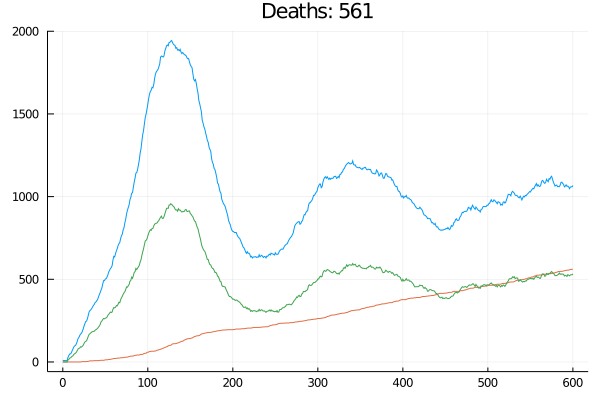

Plots.AnimatedGif("C:\\Users\\szymo\\Jupyter Projects\\epidemic.gif")
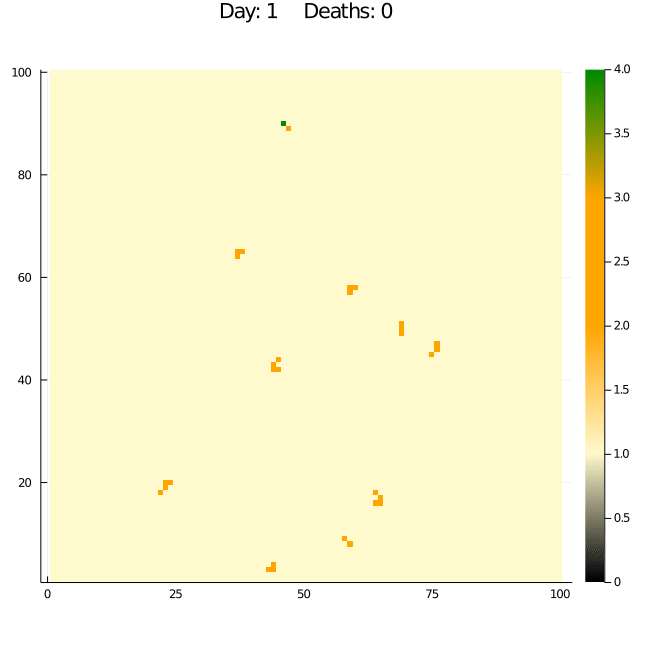

┌ Info: Saved animation to 
│   fn = C:\Users\szymo\Jupyter Projects\epidemic.gif
└ @ Plots C:\Users\szymo\.julia\packages\Plots\z5Msu\src\animation.jl:104


2-element Vector{Int64}:
 561
 957

In [20]:
# Standard parameters, no vaccination

meetings = 3
lockdowns = []
vaccination_day = 700
vaccinations = 0.004
infection_probability = 0.8
move_probability = 0.002
T = 600

area_epidemic_simulation(size, N0, meetings, incubation_time, immunity_time, lockdowns,
            vaccination_day, vaccinations, vaccine_immunity_time,
            death_prob, recovery_prob, infection_probability, symptoms_prob, move_probability, T)

### Przypadek ze szczepionką

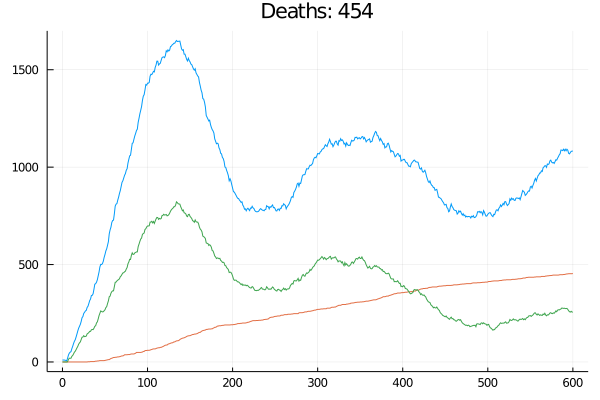

Plots.AnimatedGif("C:\\Users\\szymo\\Jupyter Projects\\epidemic.gif")
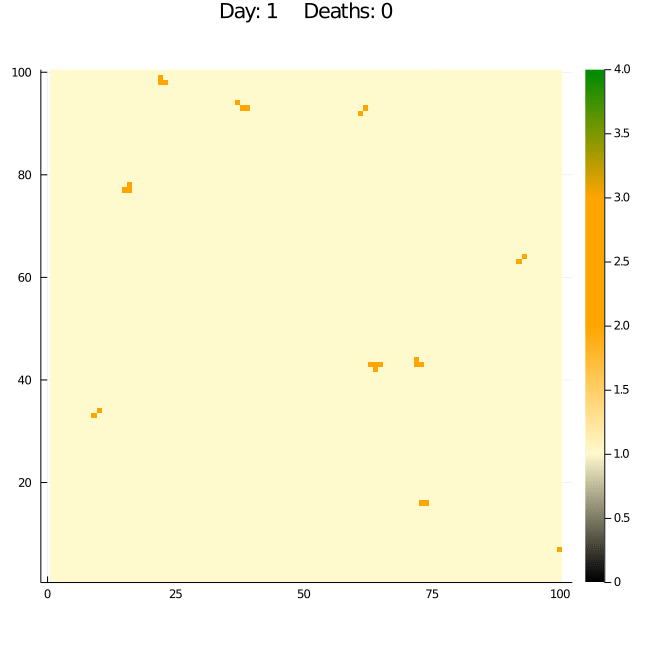

┌ Info: Saved animation to 
│   fn = C:\Users\szymo\Jupyter Projects\epidemic.gif
└ @ Plots C:\Users\szymo\.julia\packages\Plots\z5Msu\src\animation.jl:104


2-element Vector{Int64}:
 454
 822

In [21]:
# Standard parameters and vaccination

meetings = 3
lockdowns = []
vaccination_day = 300
vaccinations = 0.004
infection_probability = 0.8
move_probability = 0.002
T = 600

area_epidemic_simulation(size, N0, meetings, incubation_time, immunity_time, lockdowns,
            vaccination_day, vaccinations, vaccine_immunity_time,
            death_prob, recovery_prob, infection_probability, symptoms_prob, move_probability, T)

### A co, jeśli ludzie bardzo często by się spotykali i przemieszczali?

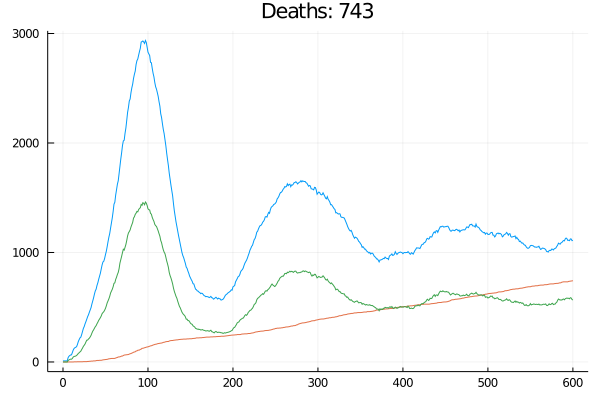

Plots.AnimatedGif("C:\\Users\\szymo\\Jupyter Projects\\epidemic.gif")
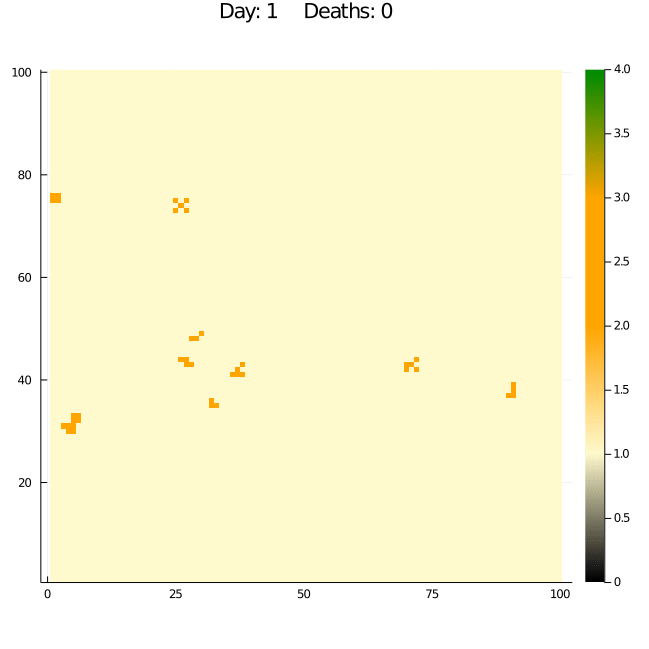

┌ Info: Saved animation to 
│   fn = C:\Users\szymo\Jupyter Projects\epidemic.gif
└ @ Plots C:\Users\szymo\.julia\packages\Plots\z5Msu\src\animation.jl:104


2-element Vector{Int64}:
  743
 1461

In [22]:
# No vaccination, increased meetings number and moving probability

meetings = 5
lockdowns = []
vaccination_day = 600
vaccinations = 0.004
infection_probability = 0.8
move_probability = 0.006
T = 600

area_epidemic_simulation(size, N0, meetings, incubation_time, immunity_time, lockdowns,
            vaccination_day, vaccinations, vaccine_immunity_time,
            death_prob, recovery_prob, infection_probability, symptoms_prob, move_probability, T)

## 
## Statystyki

### Statystyki dla różnych wartości prawdopodobieństwa przemieszczania się

In [ ]:
meetings = 3
lockdowns = []
vaccination_day = 400
vaccinations = 0.004
infection_probability = 0.8
move_probability = 0.002
T = 300

display_heatmap = false
display_plot = false

counter = 1
travels = []
deaths = []
max_infected = []

# Run three simulations for each moving probability in range from 0.01 to 0.001
for move_prob in 0.01:-0.001:0.001
    average_travels = Int(round(move_prob * size^2, digits=0))
    deaths_results = []
    max_infected_results = []
    
    # Run three simulations and calculate the average values
    for simulation in 1:3
        result = area_epidemic_simulation(size, N0, meetings, incubation_time, immunity_time, lockdowns,
                vaccination_day, vaccinations, vaccine_immunity_time,
                death_prob, recovery_prob, infection_probability, symptoms_prob, move_prob, T,
                display_heatmap, display_plot)
        
        append!(deaths_results, result[1])
        append!(max_infected_results, result[2])
        
        print(" $counter > ")   # Progress bar
        counter += 1
    end
    
    average_deaths = deaths_results |> mean |> floor |> Int
    average_max_infected = max_infected_results |> mean |> floor |> Int
    
    append!(travels, average_travels)
    append!(deaths, average_deaths)
    append!(max_infected, average_max_infected)
end

data = DataFrame(travels=travels,
                deaths=deaths,
                max_infected=max_infected)

CSV.write("travels.csv", data)

In [31]:
CSV.read("travels.csv", DataFrame)

,travels,deaths,max_infected
,Int64,Int64,Int64
1,100,333,1459
2,90,314,1462
3,80,307,1349
4,70,321,1320
5,60,316,1239
6,50,302,1158
7,40,301,1130
8,30,285,1015
9,20,273,888


### 
### Statystyki dla różnych wartości prawdopodobieństwa zarażenia

In [33]:
CSV.read("infection_prob.csv", DataFrame)

,infection_probability,deaths,max_infected
,Float64,Int64,Int64
1,0.8,144,467
2,0.7,130,406
3,0.6,124,376
4,0.5,122,324
5,0.4,98,256
6,0.3,73,172
7,0.2,32,94


### 
### Statystyki dla różnej liczby dziennych spotkań

In [8]:
CSV.read("meetings.csv", DataFrame)

,meetings,deaths,max_infected
,Int64,Int64,Int64
1,4,325,1029
2,3,287,863
3,2,239,696
4,1,168,526


### 
### Statystyki dla różnej liczby dziennych szczepień

In [34]:
CSV.read("vaccinations.csv", DataFrame)

,vaccinated,deaths,max_infected
,Int64,Int64,Int64
1,100,186,840
2,90,202,835
3,80,170,718
4,70,194,722
5,60,208,819
6,50,216,848
7,40,227,846
8,30,246,826
9,20,267,917


## 
## Jak lockdowny wpływają na przebieg epidemii?

### Przypadek bez lockdownów

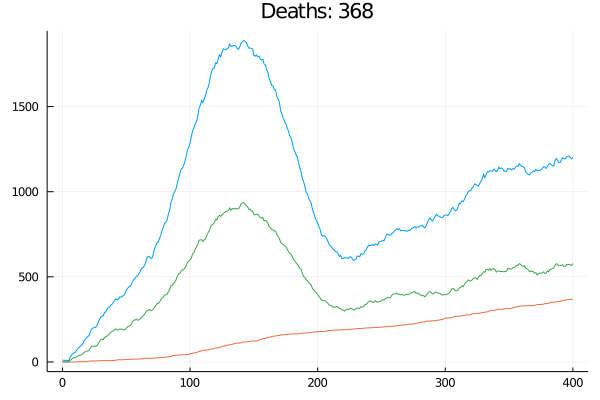

Plots.AnimatedGif("C:\\Users\\szymo\\Jupyter Projects\\epidemic.gif")
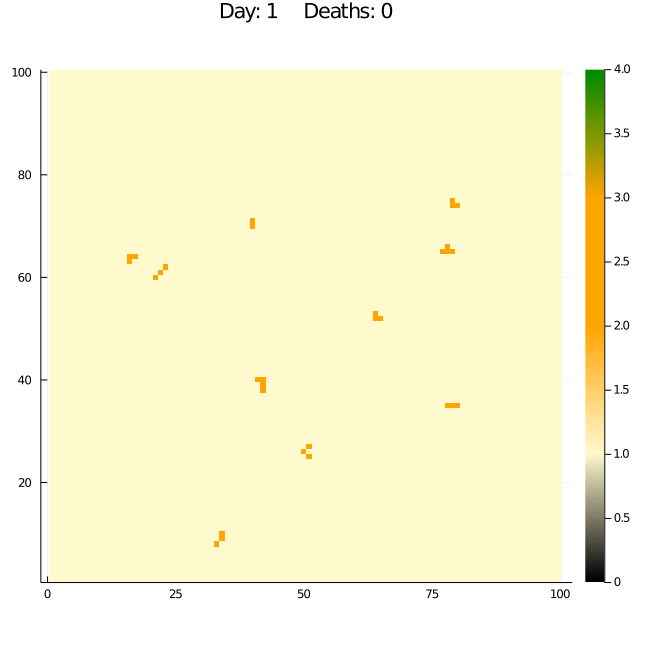

┌ Info: Saved animation to 
│   fn = C:\Users\szymo\Jupyter Projects\epidemic.gif
└ @ Plots C:\Users\szymo\.julia\packages\Plots\z5Msu\src\animation.jl:104


2-element Vector{Int64}:
 368
 936

In [38]:
# Standard parameters, no vaccination, no lockdowns

meetings = 3
lockdowns = []
vaccination_day = 700
vaccinations = 0.004
infection_probability = 0.8
move_probability = 0.002
T = 400

area_epidemic_simulation(size, N0, meetings, incubation_time, immunity_time, lockdowns,
            vaccination_day, vaccinations, vaccine_immunity_time,
            death_prob, recovery_prob, infection_probability, symptoms_prob, move_probability, T)

### Wprowadzamy lekki lockdown od 70 do 200 dnia

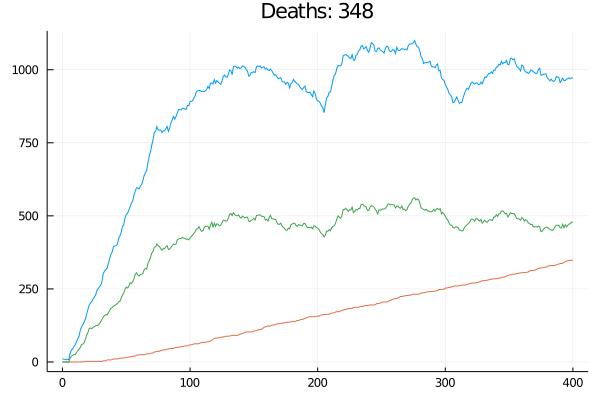

Plots.AnimatedGif("C:\\Users\\szymo\\Jupyter Projects\\epidemic.gif")
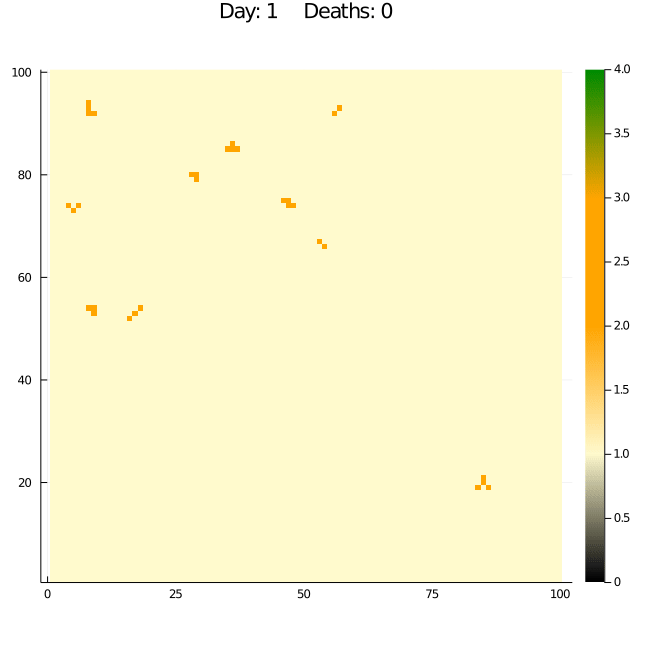

┌ Info: Saved animation to 
│   fn = C:\Users\szymo\Jupyter Projects\epidemic.gif
└ @ Plots C:\Users\szymo\.julia\packages\Plots\z5Msu\src\animation.jl:104


2-element Vector{Int64}:
 348
 562

In [39]:
# Standard parameters, no vaccination, light lockdown from 70 to 200

meetings = 3
lockdowns = [[70, 200, 1]]
vaccination_day = 700
vaccinations = 0.004
infection_probability = 0.8
move_probability = 0.002
T = 400

area_epidemic_simulation(size, N0, meetings, incubation_time, immunity_time, lockdowns,
            vaccination_day, vaccinations, vaccine_immunity_time,
            death_prob, recovery_prob, infection_probability, symptoms_prob, move_probability, T)

### Wprowadzamy ciężki lockdown
W tym przypadku lockdown będzie trwał krócej, ponieważ czas trwania lockdownu jest ograniczony. Szczególnie, jeśli mówimy o ciężkim lockdownie.

Na wykresie widzimy, że pierwsza fala trwa około czterech miesięcy. Załóżmy, że możemy wprowadzić ciężki lockdown, ale tylko na dwa miesiące. Wtedy pojawia się pytanie, kiedy to zrobić?

### Lockdown na początku fali

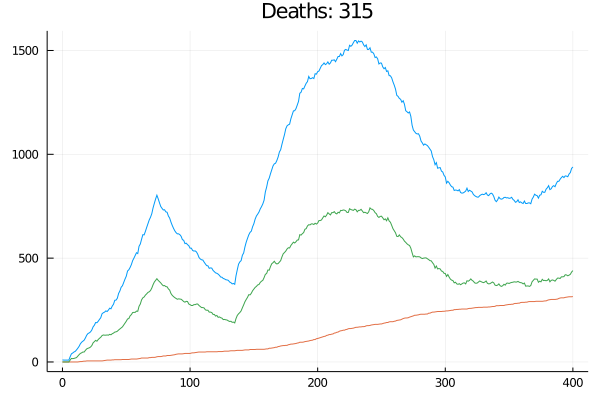

2-element Vector{Int64}:
 315
 742

In [27]:
# Standard parameters, no vaccination, heavy lockdown from 70 to 130

meetings = 3
lockdowns = [[70, 130, 2]]
vaccination_day = 700
vaccinations = 0.004
infection_probability = 0.8
move_probability = 0.002
T = 400
display_heatmap = false

area_epidemic_simulation(size, N0, meetings, incubation_time, immunity_time, lockdowns,
            vaccination_day, vaccinations, vaccine_immunity_time,
            death_prob, recovery_prob, infection_probability, symptoms_prob, move_probability, T, display_heatmap)

### Lockdown u szczytu fali

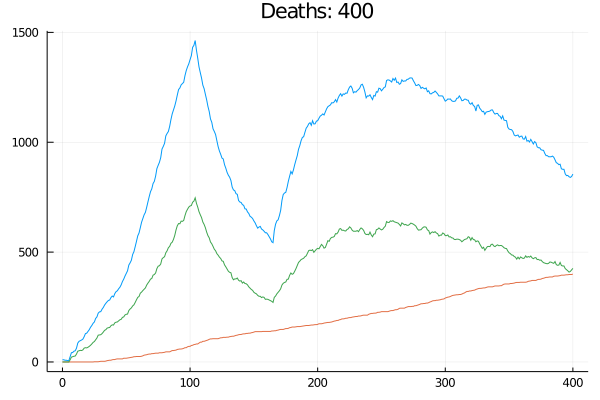

2-element Vector{Int64}:
 400
 747

In [32]:
# Standard parameters, no vaccination, heavy lockdown from 100 to 160

meetings = 3
lockdowns = [[100, 160, 2]]
vaccination_day = 700
vaccinations = 0.004
infection_probability = 0.8
move_probability = 0.002
T = 400
display_heatmap = false

area_epidemic_simulation(size, N0, meetings, incubation_time, immunity_time, lockdowns,
            vaccination_day, vaccinations, vaccine_immunity_time,
            death_prob, recovery_prob, infection_probability, symptoms_prob, move_probability, T, display_heatmap)

### 
### Przybliżenie symulacji do przebiegu COVID-19 w Polsce

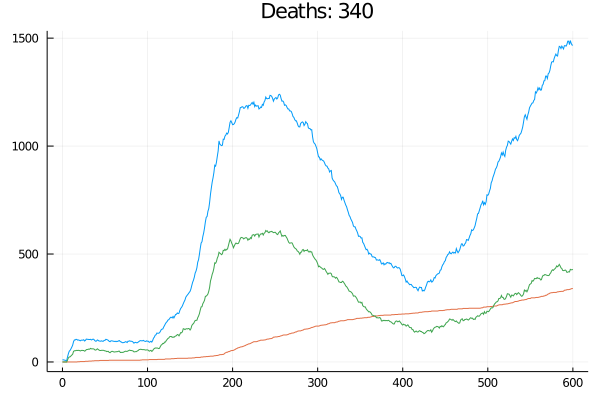

2-element Vector{Int64}:
 340
 609

In [37]:
# Standard parameters, vaccination, heavy lockdown from 10 to 100, light lockdown from 180 to 420

meetings = 3
lockdowns = [[10, 100, 2], [180, 420, 1]]
vaccination_day = 300
vaccinations = 0.003
infection_probability = 0.8
move_probability = 0.002
T = 600   # Today is 430
display_heatmap = false

area_epidemic_simulation(size, N0, meetings, incubation_time, immunity_time, lockdowns,
            vaccination_day, vaccinations, vaccine_immunity_time,
            death_prob, recovery_prob, infection_probability, symptoms_prob, move_probability, T, display_heatmap)

# 
#### Projek przygotowali:
Viktoriia Morhun<br>
Yevheniia Volkova<br>
Adam Wrzesiński<br>
Szymon Malec